In [1]:
import numpy as np
import matplotlib.pyplot as plt
np.random.seed(10)

In [2]:
# Load in the SST data
ds_train_np = np.load('NOAA_Train_Snapshots.npy')
ds_test_np = np.load('NOAA_Test_Snapshots.npy')

In [3]:
# Snapshots numbers
num_train = np.shape(ds_train_np)[0]
num_test = np.shape(ds_test_np)[0]

In [4]:
num_points = np.shape(ds_train_np)[1]*np.shape(ds_train_np)[2]
print('Total number of points in the snapshot:',num_points)

Total number of points in the snapshot: 64800


In [5]:
# Select a random subsample of them
num_sensors = 200
idx = np.arange(num_points,dtype='int')

# Shuffle
np.random.shuffle(idx)
idx = idx[:num_sensors]

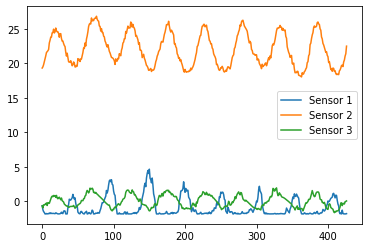

In [6]:
# Lets plot some of the measurements at these locations with time
ds_train_flat = ds_train_np.reshape(np.shape(ds_train_np)[0],np.shape(ds_train_np)[1]*np.shape(ds_train_np)[2])
ds_test_flat = ds_test_np.reshape(np.shape(ds_test_np)[0],np.shape(ds_train_np)[1]*np.shape(ds_train_np)[2])

plt.figure()
plt.plot(ds_train_flat[:,idx[0]],label='Sensor 1')
plt.plot(ds_train_flat[:,idx[1]],label='Sensor 2')
plt.plot(ds_train_flat[:,idx[2]],label='Sensor 3')
plt.legend()
plt.show()

In [7]:
# Load in the latitude and longitude information for sensors alone
lat_grid = np.load('Lat_grid.npy').flatten()
lon_grid = np.load('Lon_grid.npy').flatten()

lon_lon, lat_lat = np.meshgrid(lon_grid,lat_grid)

sensor_lats = lat_lat.flatten()[idx[:]]
sensor_lons = lon_lon.flatten()[idx[:]]

In [8]:
# Find Euclidean distance from neighbors
lon_lat_coods = np.concatenate((sensor_lons.reshape(-1,1),sensor_lats.reshape(-1,1)),axis=-1)
dist_mat = np.zeros(shape=(num_sensors,num_sensors),dtype='double')

for i in range(num_sensors):
    for j in range(num_sensors):
        dist_mat[i,j] = np.sqrt((lon_lat_coods[i,0]-lon_lat_coods[j,0])**2 + (lon_lat_coods[i,1]-lon_lat_coods[j,1])**2)

In [9]:
# Build adjacency matrix for the given sensors based on nearest neighbor interpolation
print('The mean distance is:',np.mean(dist_mat))
print('The standard deviation of the distance is:',np.std(dist_mat))

# Connection threshold
thresh = np.mean(dist_mat) - np.std(dist_mat)
adj_mat = np.copy(dist_mat)

adj_mat[adj_mat>thresh] = 0
adj_mat[adj_mat>0] = 1
np.fill_diagonal(adj_mat,val=1)

The mean distance is: 141.58481027193724
The standard deviation of the distance is: 77.24342431728113


In [10]:
from scipy import sparse
adj_mat = adj_mat.astype('int')
A = np.zeros(shape=(num_train,num_sensors,num_sensors))
A[:,:,:] = adj_mat[None,:,:]

In [12]:
# Now stack features at each node - these features will be the past weeks of weekly means
num_features = 8 # weeks of history
X = np.zeros(shape=(1,num_sensors,num_features),dtype='double')
Y = np.zeros(shape=(1,num_sensors,num_features),dtype='double')

start_id = 0
end_id = start_id + num_features
while end_id != num_train-num_features:
    X_temp = np.expand_dims(np.transpose(ds_train_flat[start_id:end_id,idx[:]]),axis=0)
    X = np.concatenate((X,X_temp),axis=0)
    
    Y_temp = np.expand_dims(np.transpose(ds_train_flat[start_id:end_id,idx[:]]),axis=0)
    Y = np.concatenate((Y,Y_temp),axis=0)
    
    start_id+=1
    end_id+=1

X = X[1:]
Y = Y[1:]

# Lets also shuffle
shuffle_idx = np.arange(X.shape[0])
np.random.shuffle(shuffle_idx)
X = X[shuffle_idx]
Y = Y[shuffle_idx]

# Get rid of superfluous A data
A = A[:X.shape[0]]

print('Final shape of training data inputs:',X.shape)
print('Final shape of training data outputs:',Y.shape)
print('Final shape of adjacency matrices:',A.shape)

Final shape of training data inputs: (411, 200, 8)
Final shape of training data outputs: (411, 200, 8)
Final shape of adjacency matrices: (411, 200, 200)


In [13]:
# Lets scale
from sklearn.preprocessing import MinMaxScaler, StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(X.reshape(-1,num_sensors*num_features))
X = X.reshape(-1,num_sensors,num_features)
Y = scaler.transform(Y.reshape(-1,num_sensors*num_features))
Y = Y.reshape(-1,num_sensors,num_features)

In [14]:
from spektral.layers import GraphConv
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Input, Dropout, Flatten, Dense, Reshape, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import mse

In [15]:
# Parameters
channels = 16           # Number of channels in the first layer
N = X.shape[1]          # Number of nodes in the graph
F = X.shape[2]          # Original size of node features
num_outputs = Y.shape[2]  # Number of outputs
dropout = 0.1           # Dropout rate for the features
l2_reg = 0.0       # L2 regularization rate
learning_rate = 1e-3    # Learning rate
epochs = 2000            # Number of training epochs
es_patience = 100        # Patience for early stopping
variational = False # Whether variational AE or not

# Preprocessing operations to scale by degree of vertex
fltr = GraphConv.preprocess(A).astype('f4')

# Adjacency information
fltr_in = Input((N, N,), sparse=False)

# Function for reparameterization trick
# instead of sampling from Q(z|X), sample eps = N(0,I)
# then z = z_mean + sqrt(var)*eps
def sampling(args):
    """Reparameterization trick by sampling fr an isotropic unit Gaussian.
     Arguments
        args (tensor): mean and log of variance of Q(z|X)
     Returns
        z (tensor): sampled latent vector
    """

    epsilon_mean = 0.0
    epsilon_std = 1.0

    z_mean, z_log_var = args
    batch = K.shape(z_mean)[0]
    dim = K.int_shape(z_mean)[1]
    # by default, random_normal has mean=0 and std=1.0
    epsilon = K.random_normal(shape=(batch, dim), mean=epsilon_mean, stddev=epsilon_std)
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

# Function for R2 calculation
def coeff_determination(y_pred, y_true): #Order of function inputs is important here        
        SS_res =  K.sum(K.square( y_true-y_pred )) 
        SS_tot = K.sum(K.square( y_true - K.mean(y_true) ) )
        return ( 1 - SS_res/(SS_tot + K.epsilon()) )

# dimensionality of latent space
num_latent = 8

In [19]:
# Define AE-GCN model
# Encoder definition
X_in = Input(shape=(N, F,))

dropout_1 = Dropout(dropout)(X_in)
graph_conv_1 = GraphConv(channels,
                         activation='tanh',
                         kernel_regularizer=l2(l2_reg),
                         use_bias=True)([dropout_1, fltr_in])

dropout_1 = Dropout(dropout)(graph_conv_1)
graph_conv_1 = GraphConv(channels,
                         activation='tanh',
                         kernel_regularizer=l2(l2_reg),
                         use_bias=True)([dropout_1, fltr_in])

dropout_1 = Dropout(dropout)(graph_conv_1)
graph_conv_1 = GraphConv(channels,
                         activation='tanh',
                         kernel_regularizer=l2(l2_reg),
                         use_bias=True)([dropout_1, fltr_in])

dropout_2 = Dropout(dropout)(graph_conv_1)
graph_conv_2 = GraphConv(channels,
                         activation='tanh',
                         use_bias=True)([dropout_2, fltr_in])

enc_fcl = Flatten()(graph_conv_2)
enc_fcl = Dense(100,activation='tanh')(enc_fcl)
enc_fcl = Dense(50,activation='tanh')(enc_fcl)
enc_fcl = Dense(25,activation='tanh')(enc_fcl)

if variational == True:
    enc_fcl = Dense(10,activation='linear')(enc_fcl)
    z_mean = Dense(num_latent, name='z_mean')(enc_fcl)
    z_log_var = Dense(num_latent, name='z_log_var')(enc_fcl)

    # use reparameterization trick to push the sampling out as input
    # note that "output_shape" isn't necessary with the TensorFlow backend
    z = Lambda(sampling, output_shape=(num_latent,), name='z')([z_mean, z_log_var])
    encoder = Model(inputs=[X_in, fltr_in], outputs=z, name='GCN_Encoder')
else:
    enc_fcl = Dense(10,activation='tanh')(enc_fcl)
    enc_fcl = Dense(num_latent,activation='linear')(enc_fcl)
    encoder = Model(inputs=[X_in, fltr_in], outputs=enc_fcl, name='GCN_Encoder')

encoder.summary()

W1128 20:20:18.377206 140464730019648 network.py:1388] Model inputs must come from `tf.keras.Input` (thus holding past layer metadata), they cannot be the output of a previous non-Input layer. Here, a tensor specified as input to "GCN_Encoder" was not an Input tensor, it was generated by layer input_1.
Note that input tensors are instantiated via `tensor = tf.keras.Input(shape)`.
The tensor that caused the issue was: input_1:0


Model: "GCN_Encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 200, 8)]     0                                            
__________________________________________________________________________________________________
dropout_6 (Dropout)             (None, 200, 8)       0           input_4[0][0]                    
__________________________________________________________________________________________________
input_1 (InputLayer)            [(None, 200, 200)]   0                                            
__________________________________________________________________________________________________
graph_conv_6 (GraphConv)        (None, 200, 16)      144         dropout_6[0][0]                  
                                                                 input_1[0][0]          

In [20]:
# Decoder definition
dec_inputs = Input(shape=(num_latent,))
dec_fcl = Dense(10,activation='tanh')(dec_inputs)
dec_fcl = Dense(25,activation='tanh')(dec_fcl)
dec_fcl = Dense(50,activation='tanh')(dec_fcl)
dec_fcl = Dense(100,activation='tanh')(dec_fcl)
dec_fcl = Dense(N*channels,activation='linear')(dec_fcl)

gcn_dec_1 = Reshape((N,channels))(dec_fcl)

dropout_1 = Dropout(dropout)(gcn_dec_1)
graph_conv_1 = GraphConv(channels,
                         activation='tanh',
                         kernel_regularizer=l2(l2_reg),
                         use_bias=True)([dropout_1, fltr_in])

dropout_2 = Dropout(dropout)(graph_conv_1)
graph_conv_2 = GraphConv(F,
                         activation=None,
                         use_bias=True)([dropout_2, fltr_in])

decoder = Model(inputs=[dec_inputs, fltr_in], outputs=graph_conv_2)
decoder.summary()

W1128 20:20:19.040285 140464730019648 network.py:1388] Model inputs must come from `tf.keras.Input` (thus holding past layer metadata), they cannot be the output of a previous non-Input layer. Here, a tensor specified as input to "model_1" was not an Input tensor, it was generated by layer input_1.
Note that input tensors are instantiated via `tensor = tf.keras.Input(shape)`.
The tensor that caused the issue was: input_1:0


Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 8)]          0                                            
__________________________________________________________________________________________________
dense_15 (Dense)                (None, 10)           90          input_5[0][0]                    
__________________________________________________________________________________________________
dense_16 (Dense)                (None, 25)           275         dense_15[0][0]                   
__________________________________________________________________________________________________
dense_17 (Dense)                (None, 50)           1300        dense_16[0][0]                   
____________________________________________________________________________________________

In [21]:
# Instantiate variational AE
ae_outputs = decoder([encoder([X_in,fltr_in]),fltr_in])
model = Model(inputs=[X_in,fltr_in],outputs=ae_outputs,name='GCN_VAE')

# Losses and optimization
my_adam = Adam(lr=learning_rate, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
reconstruction_loss = mse(K.flatten(X_in), K.flatten(ae_outputs))

if variational:
    kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
    kl_loss = K.sum(kl_loss, axis=-1)
    kl_loss *= -0.5
    final_loss = K.mean(reconstruction_loss + kl_loss)
    model.add_loss(final_loss)
else:
    model.add_loss(reconstruction_loss)

model.compile(optimizer=my_adam,metrics=[coeff_determination])
model.summary()

W1128 20:20:19.445485 140464730019648 network.py:1388] Model inputs must come from `tf.keras.Input` (thus holding past layer metadata), they cannot be the output of a previous non-Input layer. Here, a tensor specified as input to "GCN_VAE" was not an Input tensor, it was generated by layer input_1.
Note that input tensors are instantiated via `tensor = tf.keras.Input(shape)`.
The tensor that caused the issue was: input_1:0


Model: "GCN_VAE"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 200, 8)]     0                                            
__________________________________________________________________________________________________
input_1 (InputLayer)            [(None, 200, 200)]   0                                            
__________________________________________________________________________________________________
GCN_Encoder (Model)             (None, 8)            327733      input_4[0][0]                    
                                                                 input_1[0][0]                    
__________________________________________________________________________________________________
model_1 (Model)                 (None, 200, 8)       330373      GCN_Encoder[1][0]          

In [22]:
model.fit([X, fltr],
          Y,
          epochs=2000,
          batch_size=32,
          shuffle=False,  # Shuffling data means shuffling the whole graph
          callbacks=[
              EarlyStopping(patience=100,  restore_best_weights=True)
          ],
         validation_split=0.1)

Epoch 1/2000
12/12 [==============================] - 1s 49ms/step - loss: 0.8229 - coeff_determination: -13989.6445 - val_loss: 0.8404 - val_coeff_determination: -12.2350
Epoch 2/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.6612 - coeff_determination: -4.3526 - val_loss: 0.6700 - val_coeff_determination: -1.5724
Epoch 3/2000
12/12 [==============================] - 0s 33ms/step - loss: 0.5600 - coeff_determination: -1.2721 - val_loss: 0.5881 - val_coeff_determination: -0.8515
Epoch 4/2000
12/12 [==============================] - 0s 34ms/step - loss: 0.5097 - coeff_determination: -0.7608 - val_loss: 0.5413 - val_coeff_determination: -0.4483
Epoch 5/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.4808 - coeff_determination: -0.4391 - val_loss: 0.5146 - val_coeff_determination: -0.2215
Epoch 6/2000
12/12 [==============================] - 0s 33ms/step - loss: 0.4623 - coeff_determination: -0.2877 - val_loss: 0.4958 - val_coeff_determination: -

12/12 [==============================] - 0s 32ms/step - loss: 0.3217 - coeff_determination: 0.4086 - val_loss: 0.3277 - val_coeff_determination: 0.4403
Epoch 51/2000
12/12 [==============================] - 0s 34ms/step - loss: 0.3214 - coeff_determination: 0.3915 - val_loss: 0.3340 - val_coeff_determination: 0.4812
Epoch 52/2000
12/12 [==============================] - 0s 33ms/step - loss: 0.3210 - coeff_determination: 0.4059 - val_loss: 0.3284 - val_coeff_determination: 0.4243
Epoch 53/2000
12/12 [==============================] - 0s 33ms/step - loss: 0.3233 - coeff_determination: 0.4101 - val_loss: 0.3279 - val_coeff_determination: 0.5035
Epoch 54/2000
12/12 [==============================] - 0s 34ms/step - loss: 0.3194 - coeff_determination: 0.4054 - val_loss: 0.3245 - val_coeff_determination: 0.4628
Epoch 55/2000
12/12 [==============================] - 0s 33ms/step - loss: 0.3177 - coeff_determination: 0.4168 - val_loss: 0.3248 - val_coeff_determination: 0.5057
Epoch 56/2000
12/1

12/12 [==============================] - 0s 39ms/step - loss: 0.2994 - coeff_determination: 0.4731 - val_loss: 0.2990 - val_coeff_determination: 0.5689
Epoch 100/2000
12/12 [==============================] - 0s 37ms/step - loss: 0.3009 - coeff_determination: 0.4686 - val_loss: 0.3094 - val_coeff_determination: 0.5766
Epoch 101/2000
12/12 [==============================] - 1s 43ms/step - loss: 0.3004 - coeff_determination: 0.4764 - val_loss: 0.3022 - val_coeff_determination: 0.5822
Epoch 102/2000
12/12 [==============================] - 0s 39ms/step - loss: 0.3012 - coeff_determination: 0.4709 - val_loss: 0.3046 - val_coeff_determination: 0.5774
Epoch 103/2000
12/12 [==============================] - 0s 40ms/step - loss: 0.2992 - coeff_determination: 0.4768 - val_loss: 0.3002 - val_coeff_determination: 0.5778
Epoch 104/2000
12/12 [==============================] - 0s 41ms/step - loss: 0.2996 - coeff_determination: 0.4725 - val_loss: 0.2990 - val_coeff_determination: 0.5685
Epoch 105/200

Epoch 148/2000
12/12 [==============================] - 0s 35ms/step - loss: 0.2913 - coeff_determination: 0.4912 - val_loss: 0.2913 - val_coeff_determination: 0.5514
Epoch 149/2000
12/12 [==============================] - 0s 35ms/step - loss: 0.2908 - coeff_determination: 0.4955 - val_loss: 0.2900 - val_coeff_determination: 0.5423
Epoch 150/2000
12/12 [==============================] - 0s 35ms/step - loss: 0.2900 - coeff_determination: 0.5004 - val_loss: 0.2926 - val_coeff_determination: 0.5389
Epoch 151/2000
12/12 [==============================] - 0s 36ms/step - loss: 0.2908 - coeff_determination: 0.4950 - val_loss: 0.2914 - val_coeff_determination: 0.5671
Epoch 152/2000
12/12 [==============================] - 0s 35ms/step - loss: 0.2905 - coeff_determination: 0.5008 - val_loss: 0.2894 - val_coeff_determination: 0.5615
Epoch 153/2000
12/12 [==============================] - 0s 34ms/step - loss: 0.2895 - coeff_determination: 0.4989 - val_loss: 0.2880 - val_coeff_determination: 0.546

12/12 [==============================] - 0s 37ms/step - loss: 0.2851 - coeff_determination: 0.5095 - val_loss: 0.2817 - val_coeff_determination: 0.5644
Epoch 198/2000
12/12 [==============================] - 0s 35ms/step - loss: 0.2843 - coeff_determination: 0.5135 - val_loss: 0.2816 - val_coeff_determination: 0.5781
Epoch 199/2000
12/12 [==============================] - 0s 36ms/step - loss: 0.2844 - coeff_determination: 0.5122 - val_loss: 0.2808 - val_coeff_determination: 0.5618
Epoch 200/2000
12/12 [==============================] - 0s 35ms/step - loss: 0.2836 - coeff_determination: 0.5111 - val_loss: 0.2807 - val_coeff_determination: 0.5807
Epoch 201/2000
12/12 [==============================] - 0s 36ms/step - loss: 0.2828 - coeff_determination: 0.5148 - val_loss: 0.2824 - val_coeff_determination: 0.5694
Epoch 202/2000
12/12 [==============================] - 0s 39ms/step - loss: 0.2840 - coeff_determination: 0.5144 - val_loss: 0.2799 - val_coeff_determination: 0.5787
Epoch 203/200

12/12 [==============================] - 0s 36ms/step - loss: 0.2836 - coeff_determination: 0.5203 - val_loss: 0.2821 - val_coeff_determination: 0.6033
Epoch 247/2000
12/12 [==============================] - 0s 35ms/step - loss: 0.2822 - coeff_determination: 0.5183 - val_loss: 0.2825 - val_coeff_determination: 0.6092
Epoch 248/2000
12/12 [==============================] - 0s 37ms/step - loss: 0.2823 - coeff_determination: 0.5146 - val_loss: 0.2846 - val_coeff_determination: 0.5950
Epoch 249/2000
12/12 [==============================] - 0s 40ms/step - loss: 0.2831 - coeff_determination: 0.5159 - val_loss: 0.2844 - val_coeff_determination: 0.5909
Epoch 250/2000
12/12 [==============================] - 1s 42ms/step - loss: 0.2819 - coeff_determination: 0.5189 - val_loss: 0.2822 - val_coeff_determination: 0.5779
Epoch 251/2000
12/12 [==============================] - 0s 38ms/step - loss: 0.2788 - coeff_determination: 0.5184 - val_loss: 0.2833 - val_coeff_determination: 0.5811
Epoch 252/200

12/12 [==============================] - 0s 39ms/step - loss: 0.2807 - coeff_determination: 0.5180 - val_loss: 0.2811 - val_coeff_determination: 0.5945
Epoch 296/2000
12/12 [==============================] - 0s 40ms/step - loss: 0.2808 - coeff_determination: 0.5208 - val_loss: 0.2772 - val_coeff_determination: 0.5949
Epoch 297/2000
12/12 [==============================] - 0s 40ms/step - loss: 0.2809 - coeff_determination: 0.5282 - val_loss: 0.2753 - val_coeff_determination: 0.5873
Epoch 298/2000
12/12 [==============================] - 0s 39ms/step - loss: 0.2780 - coeff_determination: 0.5282 - val_loss: 0.2777 - val_coeff_determination: 0.5706
Epoch 299/2000
12/12 [==============================] - 0s 39ms/step - loss: 0.2802 - coeff_determination: 0.5296 - val_loss: 0.2795 - val_coeff_determination: 0.5667
Epoch 300/2000
12/12 [==============================] - 0s 39ms/step - loss: 0.2776 - coeff_determination: 0.5251 - val_loss: 0.2760 - val_coeff_determination: 0.5787
Epoch 301/200

12/12 [==============================] - 0s 39ms/step - loss: 0.2741 - coeff_determination: 0.5386 - val_loss: 0.2742 - val_coeff_determination: 0.6121
Epoch 345/2000
12/12 [==============================] - 0s 39ms/step - loss: 0.2742 - coeff_determination: 0.5416 - val_loss: 0.2771 - val_coeff_determination: 0.5979
Epoch 346/2000
12/12 [==============================] - 0s 40ms/step - loss: 0.2758 - coeff_determination: 0.5360 - val_loss: 0.2798 - val_coeff_determination: 0.5782
Epoch 347/2000
12/12 [==============================] - 0s 40ms/step - loss: 0.2743 - coeff_determination: 0.5391 - val_loss: 0.2732 - val_coeff_determination: 0.6007
Epoch 348/2000
12/12 [==============================] - 0s 39ms/step - loss: 0.2750 - coeff_determination: 0.5354 - val_loss: 0.2704 - val_coeff_determination: 0.5903
Epoch 349/2000
12/12 [==============================] - 0s 40ms/step - loss: 0.2753 - coeff_determination: 0.5411 - val_loss: 0.2754 - val_coeff_determination: 0.5754
Epoch 350/200

12/12 [==============================] - 1s 52ms/step - loss: 0.2723 - coeff_determination: 0.5447 - val_loss: 0.2701 - val_coeff_determination: 0.6020
Epoch 394/2000
12/12 [==============================] - 1s 46ms/step - loss: 0.2716 - coeff_determination: 0.5438 - val_loss: 0.2698 - val_coeff_determination: 0.5950
Epoch 395/2000
12/12 [==============================] - 1s 46ms/step - loss: 0.2721 - coeff_determination: 0.5478 - val_loss: 0.2739 - val_coeff_determination: 0.5792
Epoch 396/2000
12/12 [==============================] - 1s 46ms/step - loss: 0.2737 - coeff_determination: 0.5415 - val_loss: 0.2675 - val_coeff_determination: 0.6102
Epoch 397/2000
12/12 [==============================] - 1s 45ms/step - loss: 0.2729 - coeff_determination: 0.5434 - val_loss: 0.2689 - val_coeff_determination: 0.5972
Epoch 398/2000
12/12 [==============================] - 1s 48ms/step - loss: 0.2725 - coeff_determination: 0.5433 - val_loss: 0.2718 - val_coeff_determination: 0.5947
Epoch 399/200

12/12 [==============================] - 0s 37ms/step - loss: 0.2685 - coeff_determination: 0.5501 - val_loss: 0.2649 - val_coeff_determination: 0.6088
Epoch 443/2000
12/12 [==============================] - 0s 37ms/step - loss: 0.2680 - coeff_determination: 0.5505 - val_loss: 0.2663 - val_coeff_determination: 0.6178
Epoch 444/2000
12/12 [==============================] - 0s 37ms/step - loss: 0.2704 - coeff_determination: 0.5501 - val_loss: 0.2667 - val_coeff_determination: 0.6061
Epoch 445/2000
12/12 [==============================] - 0s 37ms/step - loss: 0.2691 - coeff_determination: 0.5512 - val_loss: 0.2651 - val_coeff_determination: 0.5933
Epoch 446/2000
12/12 [==============================] - 0s 37ms/step - loss: 0.2687 - coeff_determination: 0.5513 - val_loss: 0.2647 - val_coeff_determination: 0.5878
Epoch 447/2000
12/12 [==============================] - 0s 38ms/step - loss: 0.2697 - coeff_determination: 0.5525 - val_loss: 0.2675 - val_coeff_determination: 0.5820
Epoch 448/200

12/12 [==============================] - 0s 38ms/step - loss: 0.2676 - coeff_determination: 0.5552 - val_loss: 0.2628 - val_coeff_determination: 0.6214
Epoch 492/2000
12/12 [==============================] - 0s 37ms/step - loss: 0.2667 - coeff_determination: 0.5557 - val_loss: 0.2622 - val_coeff_determination: 0.6238
Epoch 493/2000
12/12 [==============================] - 0s 36ms/step - loss: 0.2670 - coeff_determination: 0.5593 - val_loss: 0.2624 - val_coeff_determination: 0.6191
Epoch 494/2000
12/12 [==============================] - 0s 37ms/step - loss: 0.2658 - coeff_determination: 0.5576 - val_loss: 0.2629 - val_coeff_determination: 0.6206
Epoch 495/2000
12/12 [==============================] - 0s 36ms/step - loss: 0.2662 - coeff_determination: 0.5586 - val_loss: 0.2631 - val_coeff_determination: 0.6040
Epoch 496/2000
12/12 [==============================] - 0s 37ms/step - loss: 0.2669 - coeff_determination: 0.5578 - val_loss: 0.2621 - val_coeff_determination: 0.6184
Epoch 497/200

12/12 [==============================] - 1s 49ms/step - loss: 0.2640 - coeff_determination: 0.5674 - val_loss: 0.2611 - val_coeff_determination: 0.5975
Epoch 541/2000
12/12 [==============================] - 1s 47ms/step - loss: 0.2653 - coeff_determination: 0.5633 - val_loss: 0.2638 - val_coeff_determination: 0.5909
Epoch 542/2000
12/12 [==============================] - 1s 53ms/step - loss: 0.2667 - coeff_determination: 0.5593 - val_loss: 0.2623 - val_coeff_determination: 0.6068
Epoch 543/2000
12/12 [==============================] - 1s 53ms/step - loss: 0.2681 - coeff_determination: 0.5554 - val_loss: 0.2636 - val_coeff_determination: 0.6102
Epoch 544/2000
12/12 [==============================] - 1s 48ms/step - loss: 0.2665 - coeff_determination: 0.5585 - val_loss: 0.2631 - val_coeff_determination: 0.6299
Epoch 545/2000
12/12 [==============================] - 1s 46ms/step - loss: 0.2659 - coeff_determination: 0.5613 - val_loss: 0.2601 - val_coeff_determination: 0.6200
Epoch 546/200

12/12 [==============================] - 0s 32ms/step - loss: 0.2641 - coeff_determination: 0.5642 - val_loss: 0.2615 - val_coeff_determination: 0.5925
Epoch 590/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2654 - coeff_determination: 0.5591 - val_loss: 0.2626 - val_coeff_determination: 0.5997
Epoch 591/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2664 - coeff_determination: 0.5633 - val_loss: 0.2679 - val_coeff_determination: 0.5724
Epoch 592/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2669 - coeff_determination: 0.5558 - val_loss: 0.2654 - val_coeff_determination: 0.5841
Epoch 593/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2672 - coeff_determination: 0.5589 - val_loss: 0.2716 - val_coeff_determination: 0.5975
Epoch 594/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2664 - coeff_determination: 0.5610 - val_loss: 0.2651 - val_coeff_determination: 0.6228
Epoch 595/200

12/12 [==============================] - 0s 31ms/step - loss: 0.2619 - coeff_determination: 0.5686 - val_loss: 0.2586 - val_coeff_determination: 0.6306
Epoch 639/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2621 - coeff_determination: 0.5651 - val_loss: 0.2584 - val_coeff_determination: 0.6408
Epoch 640/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2618 - coeff_determination: 0.5674 - val_loss: 0.2611 - val_coeff_determination: 0.6476
Epoch 641/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2627 - coeff_determination: 0.5676 - val_loss: 0.2584 - val_coeff_determination: 0.6410
Epoch 642/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2617 - coeff_determination: 0.5707 - val_loss: 0.2593 - val_coeff_determination: 0.6126
Epoch 643/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2619 - coeff_determination: 0.5678 - val_loss: 0.2586 - val_coeff_determination: 0.6109
Epoch 644/200

12/12 [==============================] - 0s 32ms/step - loss: 0.2614 - coeff_determination: 0.5685 - val_loss: 0.2556 - val_coeff_determination: 0.6218
Epoch 688/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2598 - coeff_determination: 0.5735 - val_loss: 0.2575 - val_coeff_determination: 0.6389
Epoch 689/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2619 - coeff_determination: 0.5709 - val_loss: 0.2582 - val_coeff_determination: 0.6284
Epoch 690/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2594 - coeff_determination: 0.5721 - val_loss: 0.2554 - val_coeff_determination: 0.6429
Epoch 691/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2588 - coeff_determination: 0.5741 - val_loss: 0.2556 - val_coeff_determination: 0.6426
Epoch 692/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2611 - coeff_determination: 0.5706 - val_loss: 0.2568 - val_coeff_determination: 0.6396
Epoch 693/200

12/12 [==============================] - 0s 31ms/step - loss: 0.2594 - coeff_determination: 0.5763 - val_loss: 0.2546 - val_coeff_determination: 0.6403
Epoch 737/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2588 - coeff_determination: 0.5738 - val_loss: 0.2528 - val_coeff_determination: 0.6501
Epoch 738/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2578 - coeff_determination: 0.5758 - val_loss: 0.2568 - val_coeff_determination: 0.6505
Epoch 739/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2591 - coeff_determination: 0.5764 - val_loss: 0.2571 - val_coeff_determination: 0.6367
Epoch 740/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2591 - coeff_determination: 0.5767 - val_loss: 0.2549 - val_coeff_determination: 0.6227
Epoch 741/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2584 - coeff_determination: 0.5756 - val_loss: 0.2547 - val_coeff_determination: 0.6292
Epoch 742/200

12/12 [==============================] - 0s 32ms/step - loss: 0.2580 - coeff_determination: 0.5740 - val_loss: 0.2545 - val_coeff_determination: 0.6503
Epoch 786/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2571 - coeff_determination: 0.5791 - val_loss: 0.2563 - val_coeff_determination: 0.6452
Epoch 787/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2600 - coeff_determination: 0.5760 - val_loss: 0.2546 - val_coeff_determination: 0.6382
Epoch 788/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2590 - coeff_determination: 0.5721 - val_loss: 0.2534 - val_coeff_determination: 0.6340
Epoch 789/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2585 - coeff_determination: 0.5766 - val_loss: 0.2553 - val_coeff_determination: 0.6288
Epoch 790/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2585 - coeff_determination: 0.5774 - val_loss: 0.2519 - val_coeff_determination: 0.6256
Epoch 791/200

12/12 [==============================] - 0s 32ms/step - loss: 0.2583 - coeff_determination: 0.5792 - val_loss: 0.2512 - val_coeff_determination: 0.6259
Epoch 835/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2573 - coeff_determination: 0.5837 - val_loss: 0.2514 - val_coeff_determination: 0.6325
Epoch 836/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2549 - coeff_determination: 0.5775 - val_loss: 0.2516 - val_coeff_determination: 0.6362
Epoch 837/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2548 - coeff_determination: 0.5790 - val_loss: 0.2514 - val_coeff_determination: 0.6331
Epoch 838/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2572 - coeff_determination: 0.5901 - val_loss: 0.2544 - val_coeff_determination: 0.6123
Epoch 839/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2575 - coeff_determination: 0.5819 - val_loss: 0.2533 - val_coeff_determination: 0.6173
Epoch 840/200

12/12 [==============================] - 1s 75ms/step - loss: 0.2544 - coeff_determination: 0.5839 - val_loss: 0.2502 - val_coeff_determination: 0.6410
Epoch 884/2000
12/12 [==============================] - 1s 64ms/step - loss: 0.2537 - coeff_determination: 0.5886 - val_loss: 0.2507 - val_coeff_determination: 0.6372
Epoch 885/2000
12/12 [==============================] - 1s 66ms/step - loss: 0.2539 - coeff_determination: 0.5860 - val_loss: 0.2501 - val_coeff_determination: 0.6290
Epoch 886/2000
12/12 [==============================] - 1s 80ms/step - loss: 0.2544 - coeff_determination: 0.5864 - val_loss: 0.2497 - val_coeff_determination: 0.6347
Epoch 887/2000
12/12 [==============================] - 1s 72ms/step - loss: 0.2540 - coeff_determination: 0.5867 - val_loss: 0.2494 - val_coeff_determination: 0.6387
Epoch 888/2000
12/12 [==============================] - 1s 81ms/step - loss: 0.2541 - coeff_determination: 0.5872 - val_loss: 0.2489 - val_coeff_determination: 0.6473
Epoch 889/200

12/12 [==============================] - 1s 48ms/step - loss: 0.2531 - coeff_determination: 0.5860 - val_loss: 0.2496 - val_coeff_determination: 0.6407
Epoch 933/2000
12/12 [==============================] - 1s 43ms/step - loss: 0.2536 - coeff_determination: 0.5857 - val_loss: 0.2480 - val_coeff_determination: 0.6538
Epoch 934/2000
12/12 [==============================] - 0s 41ms/step - loss: 0.2533 - coeff_determination: 0.5868 - val_loss: 0.2487 - val_coeff_determination: 0.6486
Epoch 935/2000
12/12 [==============================] - 0s 39ms/step - loss: 0.2542 - coeff_determination: 0.5872 - val_loss: 0.2483 - val_coeff_determination: 0.6598
Epoch 936/2000
12/12 [==============================] - 0s 38ms/step - loss: 0.2535 - coeff_determination: 0.5898 - val_loss: 0.2523 - val_coeff_determination: 0.6455
Epoch 937/2000
12/12 [==============================] - 0s 38ms/step - loss: 0.2534 - coeff_determination: 0.5893 - val_loss: 0.2498 - val_coeff_determination: 0.6452
Epoch 938/200

12/12 [==============================] - 1s 50ms/step - loss: 0.2539 - coeff_determination: 0.5840 - val_loss: 0.2481 - val_coeff_determination: 0.6515
Epoch 982/2000
12/12 [==============================] - 1s 49ms/step - loss: 0.2526 - coeff_determination: 0.5878 - val_loss: 0.2499 - val_coeff_determination: 0.6628
Epoch 983/2000
12/12 [==============================] - 0s 41ms/step - loss: 0.2522 - coeff_determination: 0.5859 - val_loss: 0.2497 - val_coeff_determination: 0.6590
Epoch 984/2000
12/12 [==============================] - 0s 39ms/step - loss: 0.2523 - coeff_determination: 0.5915 - val_loss: 0.2481 - val_coeff_determination: 0.6452
Epoch 985/2000
12/12 [==============================] - 1s 42ms/step - loss: 0.2535 - coeff_determination: 0.5898 - val_loss: 0.2498 - val_coeff_determination: 0.6241
Epoch 986/2000
12/12 [==============================] - 1s 44ms/step - loss: 0.2552 - coeff_determination: 0.5832 - val_loss: 0.2515 - val_coeff_determination: 0.6280
Epoch 987/200

Epoch 1030/2000
12/12 [==============================] - 0s 34ms/step - loss: 0.2514 - coeff_determination: 0.5969 - val_loss: 0.2499 - val_coeff_determination: 0.6233
Epoch 1031/2000
12/12 [==============================] - 0s 33ms/step - loss: 0.2526 - coeff_determination: 0.5955 - val_loss: 0.2449 - val_coeff_determination: 0.6487
Epoch 1032/2000
12/12 [==============================] - 1s 42ms/step - loss: 0.2503 - coeff_determination: 0.5946 - val_loss: 0.2470 - val_coeff_determination: 0.6508
Epoch 1033/2000
12/12 [==============================] - 1s 44ms/step - loss: 0.2498 - coeff_determination: 0.5914 - val_loss: 0.2466 - val_coeff_determination: 0.6619
Epoch 1034/2000
12/12 [==============================] - 1s 45ms/step - loss: 0.2524 - coeff_determination: 0.5950 - val_loss: 0.2463 - val_coeff_determination: 0.6524
Epoch 1035/2000
12/12 [==============================] - 1s 42ms/step - loss: 0.2512 - coeff_determination: 0.5911 - val_loss: 0.2484 - val_coeff_determination:

Epoch 1079/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2502 - coeff_determination: 0.5918 - val_loss: 0.2456 - val_coeff_determination: 0.6557
Epoch 1080/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2505 - coeff_determination: 0.5951 - val_loss: 0.2485 - val_coeff_determination: 0.6554
Epoch 1081/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2508 - coeff_determination: 0.5948 - val_loss: 0.2478 - val_coeff_determination: 0.6569
Epoch 1082/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2507 - coeff_determination: 0.5948 - val_loss: 0.2472 - val_coeff_determination: 0.6473
Epoch 1083/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2489 - coeff_determination: 0.5978 - val_loss: 0.2451 - val_coeff_determination: 0.6544
Epoch 1084/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2499 - coeff_determination: 0.5903 - val_loss: 0.2458 - val_coeff_determination:

Epoch 1128/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2496 - coeff_determination: 0.5928 - val_loss: 0.2461 - val_coeff_determination: 0.6732
Epoch 1129/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2510 - coeff_determination: 0.5954 - val_loss: 0.2467 - val_coeff_determination: 0.6522
Epoch 1130/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2491 - coeff_determination: 0.5933 - val_loss: 0.2443 - val_coeff_determination: 0.6505
Epoch 1131/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2490 - coeff_determination: 0.6061 - val_loss: 0.2460 - val_coeff_determination: 0.6335
Epoch 1132/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2507 - coeff_determination: 0.5975 - val_loss: 0.2469 - val_coeff_determination: 0.6349
Epoch 1133/2000
12/12 [==============================] - 0s 39ms/step - loss: 0.2490 - coeff_determination: 0.5989 - val_loss: 0.2443 - val_coeff_determination:

Epoch 1177/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2480 - coeff_determination: 0.6062 - val_loss: 0.2449 - val_coeff_determination: 0.6487
Epoch 1178/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2481 - coeff_determination: 0.5939 - val_loss: 0.2455 - val_coeff_determination: 0.6535
Epoch 1179/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2482 - coeff_determination: 0.6017 - val_loss: 0.2443 - val_coeff_determination: 0.6621
Epoch 1180/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2473 - coeff_determination: 0.5991 - val_loss: 0.2431 - val_coeff_determination: 0.6670
Epoch 1181/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2484 - coeff_determination: 0.6011 - val_loss: 0.2421 - val_coeff_determination: 0.6560
Epoch 1182/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2479 - coeff_determination: 0.5992 - val_loss: 0.2438 - val_coeff_determination:

Epoch 1226/2000
12/12 [==============================] - 1s 42ms/step - loss: 0.2491 - coeff_determination: 0.6001 - val_loss: 0.2444 - val_coeff_determination: 0.6568
Epoch 1227/2000
12/12 [==============================] - 1s 43ms/step - loss: 0.2497 - coeff_determination: 0.5964 - val_loss: 0.2466 - val_coeff_determination: 0.6498
Epoch 1228/2000
12/12 [==============================] - 1s 42ms/step - loss: 0.2492 - coeff_determination: 0.5980 - val_loss: 0.2469 - val_coeff_determination: 0.6504
Epoch 1229/2000
12/12 [==============================] - 1s 44ms/step - loss: 0.2481 - coeff_determination: 0.6009 - val_loss: 0.2458 - val_coeff_determination: 0.6465
Epoch 1230/2000
12/12 [==============================] - 1s 44ms/step - loss: 0.2481 - coeff_determination: 0.6001 - val_loss: 0.2436 - val_coeff_determination: 0.6636
Epoch 1231/2000
12/12 [==============================] - 1s 45ms/step - loss: 0.2479 - coeff_determination: 0.6029 - val_loss: 0.2436 - val_coeff_determination:

Epoch 1275/2000
12/12 [==============================] - 0s 41ms/step - loss: 0.2469 - coeff_determination: 0.6006 - val_loss: 0.2434 - val_coeff_determination: 0.6570
Epoch 1276/2000
12/12 [==============================] - 0s 40ms/step - loss: 0.2477 - coeff_determination: 0.6040 - val_loss: 0.2427 - val_coeff_determination: 0.6536
Epoch 1277/2000
12/12 [==============================] - 0s 40ms/step - loss: 0.2461 - coeff_determination: 0.6012 - val_loss: 0.2456 - val_coeff_determination: 0.6608
Epoch 1278/2000
12/12 [==============================] - 0s 41ms/step - loss: 0.2464 - coeff_determination: 0.6029 - val_loss: 0.2443 - val_coeff_determination: 0.6415
Epoch 1279/2000
12/12 [==============================] - 0s 35ms/step - loss: 0.2465 - coeff_determination: 0.6077 - val_loss: 0.2453 - val_coeff_determination: 0.6378
Epoch 1280/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2492 - coeff_determination: 0.6000 - val_loss: 0.2447 - val_coeff_determination:

Epoch 1324/2000
12/12 [==============================] - 0s 33ms/step - loss: 0.2482 - coeff_determination: 0.6014 - val_loss: 0.2426 - val_coeff_determination: 0.6508
Epoch 1325/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2470 - coeff_determination: 0.6059 - val_loss: 0.2456 - val_coeff_determination: 0.6204
Epoch 1326/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2460 - coeff_determination: 0.6066 - val_loss: 0.2431 - val_coeff_determination: 0.6398
Epoch 1327/2000
12/12 [==============================] - 0s 37ms/step - loss: 0.2453 - coeff_determination: 0.6075 - val_loss: 0.2429 - val_coeff_determination: 0.6441
Epoch 1328/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2470 - coeff_determination: 0.6021 - val_loss: 0.2412 - val_coeff_determination: 0.6730
Epoch 1329/2000
12/12 [==============================] - 0s 33ms/step - loss: 0.2462 - coeff_determination: 0.6031 - val_loss: 0.2427 - val_coeff_determination:

Epoch 1373/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2478 - coeff_determination: 0.6012 - val_loss: 0.2422 - val_coeff_determination: 0.6694
Epoch 1374/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2467 - coeff_determination: 0.6022 - val_loss: 0.2406 - val_coeff_determination: 0.6724
Epoch 1375/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2453 - coeff_determination: 0.6065 - val_loss: 0.2436 - val_coeff_determination: 0.6636
Epoch 1376/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2462 - coeff_determination: 0.6038 - val_loss: 0.2426 - val_coeff_determination: 0.6657
Epoch 1377/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2439 - coeff_determination: 0.6045 - val_loss: 0.2412 - val_coeff_determination: 0.6576
Epoch 1378/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2442 - coeff_determination: 0.6124 - val_loss: 0.2415 - val_coeff_determination:

Epoch 1422/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2447 - coeff_determination: 0.6081 - val_loss: 0.2402 - val_coeff_determination: 0.6736
Epoch 1423/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2444 - coeff_determination: 0.6120 - val_loss: 0.2408 - val_coeff_determination: 0.6617
Epoch 1424/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2440 - coeff_determination: 0.6072 - val_loss: 0.2412 - val_coeff_determination: 0.6705
Epoch 1425/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2455 - coeff_determination: 0.6049 - val_loss: 0.2402 - val_coeff_determination: 0.6537
Epoch 1426/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2446 - coeff_determination: 0.6110 - val_loss: 0.2400 - val_coeff_determination: 0.6484
Epoch 1427/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2438 - coeff_determination: 0.6101 - val_loss: 0.2409 - val_coeff_determination:

Epoch 1471/2000
12/12 [==============================] - 0s 36ms/step - loss: 0.2449 - coeff_determination: 0.6088 - val_loss: 0.2406 - val_coeff_determination: 0.6529
Epoch 1472/2000
12/12 [==============================] - 0s 37ms/step - loss: 0.2455 - coeff_determination: 0.6065 - val_loss: 0.2447 - val_coeff_determination: 0.6650
Epoch 1473/2000
12/12 [==============================] - 0s 34ms/step - loss: 0.2449 - coeff_determination: 0.6108 - val_loss: 0.2399 - val_coeff_determination: 0.6516
Epoch 1474/2000
12/12 [==============================] - 0s 34ms/step - loss: 0.2463 - coeff_determination: 0.6081 - val_loss: 0.2402 - val_coeff_determination: 0.6643
Epoch 1475/2000
12/12 [==============================] - 0s 34ms/step - loss: 0.2460 - coeff_determination: 0.6031 - val_loss: 0.2401 - val_coeff_determination: 0.6778
Epoch 1476/2000
12/12 [==============================] - 0s 37ms/step - loss: 0.2451 - coeff_determination: 0.6092 - val_loss: 0.2416 - val_coeff_determination:

Epoch 1520/2000
12/12 [==============================] - 1s 51ms/step - loss: 0.2434 - coeff_determination: 0.6103 - val_loss: 0.2382 - val_coeff_determination: 0.6760
Epoch 1521/2000
12/12 [==============================] - 0s 37ms/step - loss: 0.2447 - coeff_determination: 0.6110 - val_loss: 0.2404 - val_coeff_determination: 0.6723
Epoch 1522/2000
12/12 [==============================] - 0s 37ms/step - loss: 0.2447 - coeff_determination: 0.6119 - val_loss: 0.2396 - val_coeff_determination: 0.6654
Epoch 1523/2000
12/12 [==============================] - 0s 40ms/step - loss: 0.2446 - coeff_determination: 0.6081 - val_loss: 0.2424 - val_coeff_determination: 0.6573
Epoch 1524/2000
12/12 [==============================] - 0s 39ms/step - loss: 0.2441 - coeff_determination: 0.6110 - val_loss: 0.2428 - val_coeff_determination: 0.6591
Epoch 1525/2000
12/12 [==============================] - 0s 38ms/step - loss: 0.2460 - coeff_determination: 0.6062 - val_loss: 0.2426 - val_coeff_determination:

Epoch 1569/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2421 - coeff_determination: 0.6159 - val_loss: 0.2389 - val_coeff_determination: 0.6614
Epoch 1570/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2427 - coeff_determination: 0.6128 - val_loss: 0.2405 - val_coeff_determination: 0.6853
Epoch 1571/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2417 - coeff_determination: 0.6107 - val_loss: 0.2397 - val_coeff_determination: 0.6766
Epoch 1572/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2422 - coeff_determination: 0.6102 - val_loss: 0.2386 - val_coeff_determination: 0.6777
Epoch 1573/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2423 - coeff_determination: 0.6128 - val_loss: 0.2404 - val_coeff_determination: 0.6686
Epoch 1574/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2432 - coeff_determination: 0.6122 - val_loss: 0.2396 - val_coeff_determination:

Epoch 1618/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2430 - coeff_determination: 0.6119 - val_loss: 0.2406 - val_coeff_determination: 0.6533
Epoch 1619/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2433 - coeff_determination: 0.6122 - val_loss: 0.2394 - val_coeff_determination: 0.6536
Epoch 1620/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2421 - coeff_determination: 0.6158 - val_loss: 0.2379 - val_coeff_determination: 0.6570
Epoch 1621/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2420 - coeff_determination: 0.6157 - val_loss: 0.2378 - val_coeff_determination: 0.6768
Epoch 1622/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2418 - coeff_determination: 0.6147 - val_loss: 0.2398 - val_coeff_determination: 0.6688
Epoch 1623/2000
12/12 [==============================] - 0s 38ms/step - loss: 0.2426 - coeff_determination: 0.6093 - val_loss: 0.2418 - val_coeff_determination:

Epoch 1667/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2414 - coeff_determination: 0.6156 - val_loss: 0.2361 - val_coeff_determination: 0.6691
Epoch 1668/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2416 - coeff_determination: 0.6101 - val_loss: 0.2374 - val_coeff_determination: 0.6885
Epoch 1669/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2414 - coeff_determination: 0.6182 - val_loss: 0.2383 - val_coeff_determination: 0.6821
Epoch 1670/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2421 - coeff_determination: 0.6150 - val_loss: 0.2394 - val_coeff_determination: 0.6688
Epoch 1671/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2417 - coeff_determination: 0.6142 - val_loss: 0.2368 - val_coeff_determination: 0.6664
Epoch 1672/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2411 - coeff_determination: 0.6182 - val_loss: 0.2375 - val_coeff_determination:

Epoch 1716/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2399 - coeff_determination: 0.6148 - val_loss: 0.2399 - val_coeff_determination: 0.6800
Epoch 1717/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2415 - coeff_determination: 0.6155 - val_loss: 0.2380 - val_coeff_determination: 0.6759
Epoch 1718/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2422 - coeff_determination: 0.6177 - val_loss: 0.2390 - val_coeff_determination: 0.6857
Epoch 1719/2000
12/12 [==============================] - 0s 32ms/step - loss: 0.2413 - coeff_determination: 0.6156 - val_loss: 0.2382 - val_coeff_determination: 0.6766
Epoch 1720/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2408 - coeff_determination: 0.6170 - val_loss: 0.2385 - val_coeff_determination: 0.6811
Epoch 1721/2000
12/12 [==============================] - 0s 31ms/step - loss: 0.2424 - coeff_determination: 0.6140 - val_loss: 0.2435 - val_coeff_determination:

Epoch 1765/2000
12/12 [==============================] - 0s 36ms/step - loss: 0.2400 - coeff_determination: 0.6218 - val_loss: 0.2370 - val_coeff_determination: 0.6517
Epoch 1766/2000
12/12 [==============================] - 0s 36ms/step - loss: 0.2408 - coeff_determination: 0.6168 - val_loss: 0.2381 - val_coeff_determination: 0.6621
Epoch 1767/2000
12/12 [==============================] - 0s 37ms/step - loss: 0.2407 - coeff_determination: 0.6174 - val_loss: 0.2383 - val_coeff_determination: 0.6728


In [23]:
# Lets do evaluations on testing - first set up data
X_test = np.zeros(shape=(1,num_sensors,num_features),dtype='double')
Y_test = np.zeros(shape=(1,num_sensors,num_features),dtype='double')

start_id = 0
end_id = start_id + num_features
while end_id < num_test-2*num_features:
    X_temp = np.expand_dims(np.transpose(ds_test_flat[start_id:end_id,idx[:]]),axis=0)    
    X_test = np.concatenate((X_test,X_temp),axis=0)
    
    Y_temp = np.expand_dims(np.transpose(ds_test_flat[start_id:end_id,idx[:]]),axis=0)
    Y_test = np.concatenate((Y_test,Y_temp),axis=0)
    
    start_id+=num_features
    end_id+=num_features

X_test = X_test[1:]
Y_test = Y_test[1:]

# Test adjacency matrix
A_test = np.zeros(shape=(num_test,num_sensors,num_sensors))
A_test[:,:,:] = adj_mat[None,:,:]
A_test = A_test[:X_test.shape[0]]

print('Final shape of testing data inputs:',X_test.shape)
print('Final shape of testing data outputs:',Y_test.shape)
print('Final shape of testing adjacency matrix:',A_test.shape)

# Preprocessing operations to scale by degree of vertex
fltr = GraphConv.preprocess(A_test).astype('f4')

Final shape of testing data inputs: (199, 200, 8)
Final shape of testing data outputs: (199, 200, 8)
Final shape of testing adjacency matrix: (199, 200, 200)


In [24]:
# Reshape
X_test = scaler.transform(X_test.reshape(-1,num_sensors*num_features))
X_test = X_test.reshape(-1,num_sensors,num_features)

Y_test = scaler.transform(Y_test.reshape(-1,num_sensors*num_features))
Y_test = Y_test.reshape(-1,num_sensors,num_features)

In [25]:
# Evaluate model
print('Evaluating model.')
eval_results = model.evaluate([X_test, fltr],
                              Y_test,
                              batch_size=X_test.shape[0])

print(eval_results)

Evaluating model.
1/1 [==============================] - 0s 815us/step - loss: 0.8222 - coeff_determination: -0.2969
[0.8222336173057556, -0.2969459295272827]


In [26]:
# Visualize forecasts
Y_pred = model.predict([X_test,fltr])

# Rescale
Y_test = scaler.inverse_transform(Y_test.reshape(-1,num_sensors*num_features))
Y_pred = scaler.inverse_transform(Y_pred.reshape(-1,num_sensors*num_features))

In [27]:
Y_test = Y_test.reshape(-1,num_sensors,num_features)
Y_pred = Y_pred.reshape(-1,num_sensors,num_features)

# Some reshaping before plotting
Y_test = np.einsum('ijk->jik', Y_test)
Y_pred = np.einsum('ijk->jik', Y_pred)

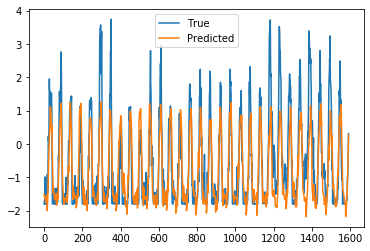

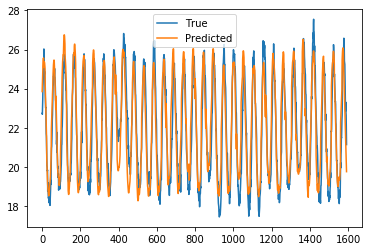

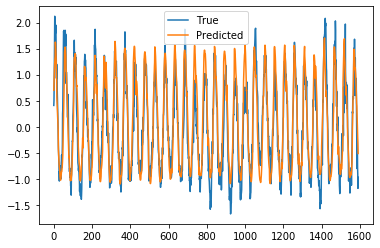

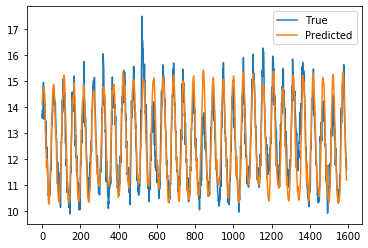

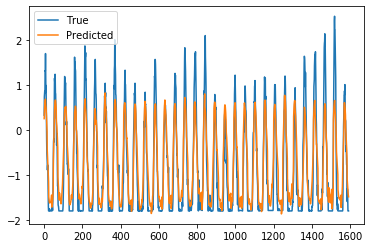

...

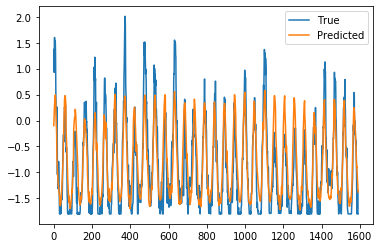

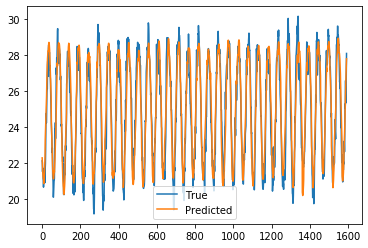

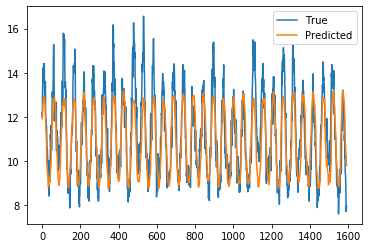

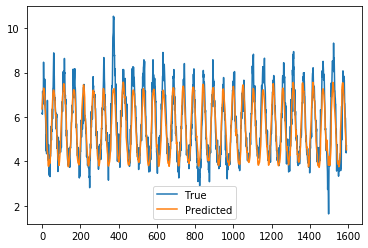

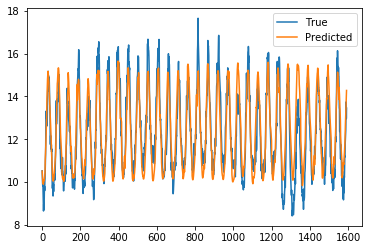

In [28]:
Y_test = Y_test.reshape(num_sensors,np.shape(Y_test)[1]*np.shape(Y_test)[2])
Y_pred = Y_pred.reshape(num_sensors,np.shape(Y_pred)[1]*np.shape(Y_pred)[2])

for sensor_loc in range(num_sensors):
    plt.figure()
    plt.plot(Y_test[sensor_loc,:],label='True')
    plt.plot(Y_pred[sensor_loc,:],label='Predicted')
    plt.legend()
    plt.show()